# Data Lab

Load different libraries

In [1]:
from IPython.display import Image # Images
from IPython.core.display import HTML  # Images size

## How to extract data? Tweepy
Go to http://www.tweepy.org/

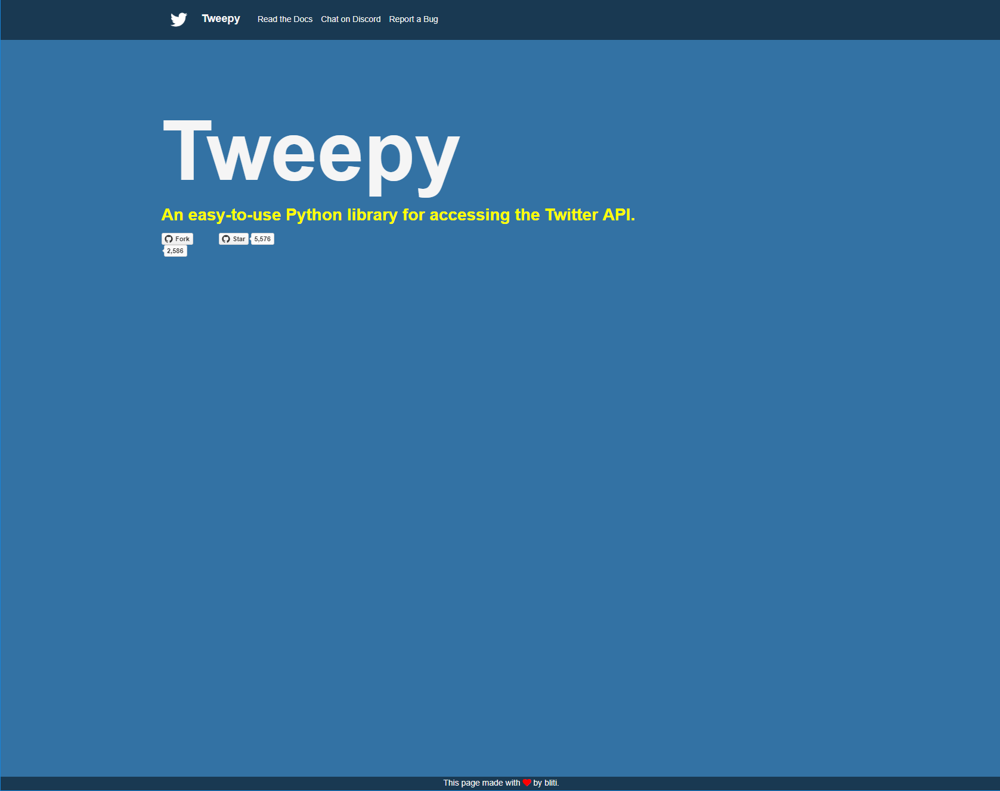

In [2]:
Image("tweepy_intro.png", width=900)

Install the library
conda install -c conda-forge tweepy 

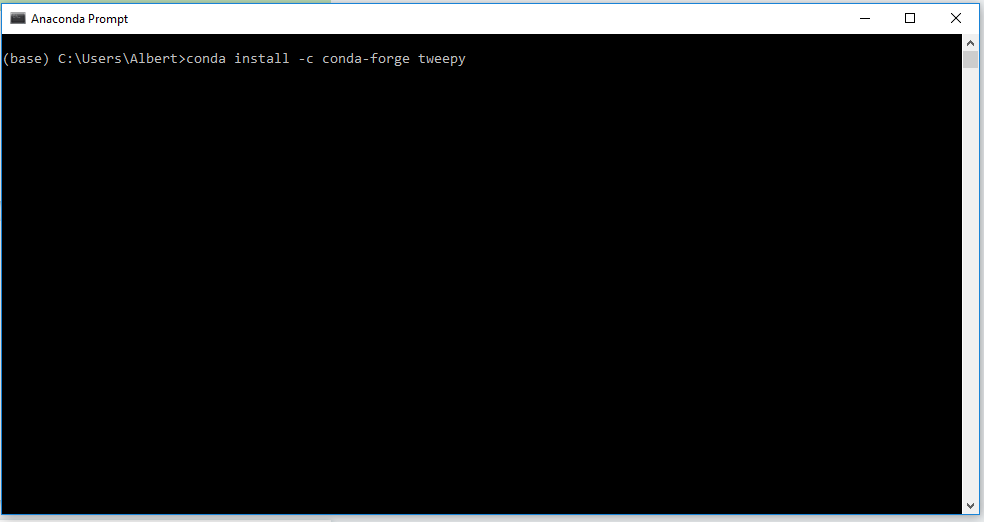

In [3]:
Image("install_anaconda.png", width=900)

In [4]:
import tweepy

Then, you need to load the library and provide the authentification from Twitter

Go to https://developer.twitter.com/

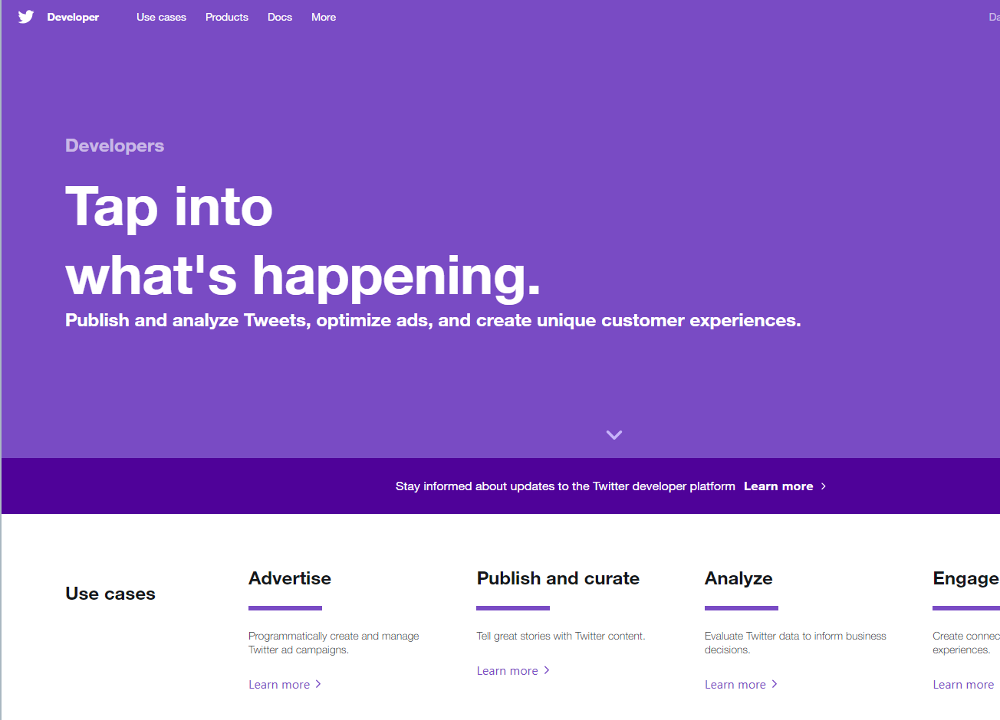

In [5]:
Image("twitter_ai_intro.png", width=900)

Create an App

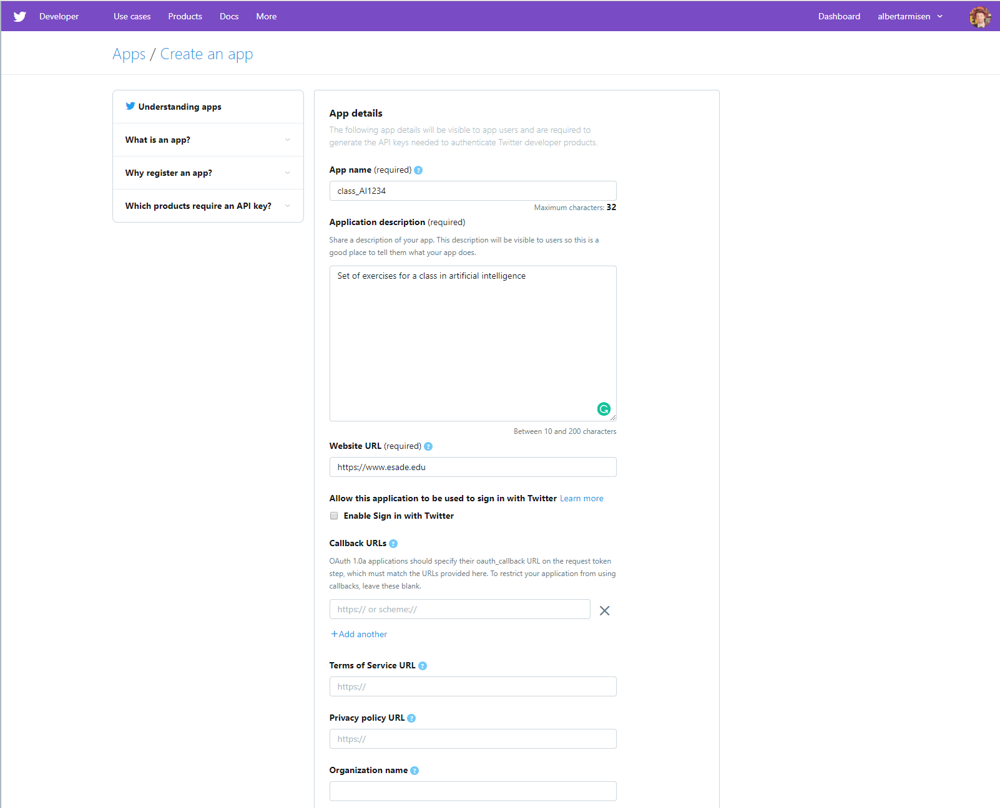

In [6]:
Image("twitter_ai_app1.png", width=900)

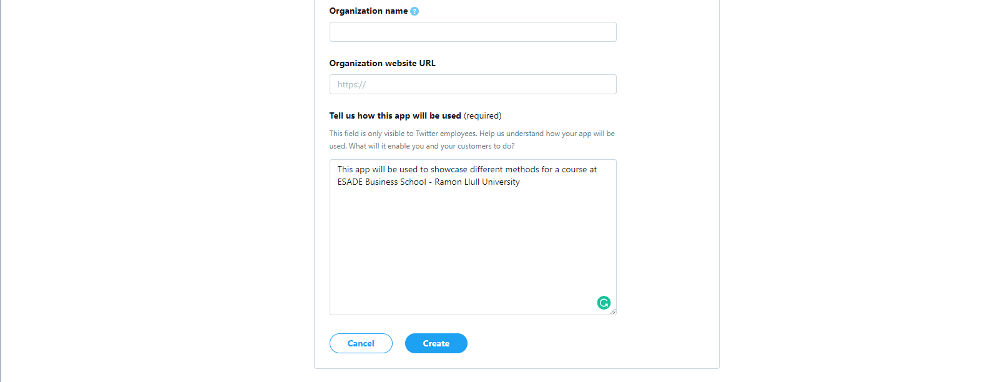

In [7]:
Image("twitter_ai_app2.png", width=900)

In [23]:
with open('consumer_key.txt', 'r') as f:
    consumer_key =  f.read()
f.closed

with open('consumer_secret.txt', 'r') as f:
    consumer_secret = f.read()
f.closed

with open('access_key.txt', 'r') as f:
    access_key = f.read()
f.closed

with open('access_secret.txt', 'r') as f:
     access_secret = f.read()
f.closed

auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)

api = tweepy.API(auth, wait_on_rate_limit=True,
                 wait_on_rate_limit_notify=True) # Connect to the api

if (not api):
    print ("No se puede autentificar")
    sys.exit(-1)

### Example 1: Extract basic information
The first step we are going to do a simple action (what are my public tweets)

In [24]:



public_tweets = api.home_timeline() # Get the post in the timeline
for tweet in public_tweets:
    print(tweet.text)

TweepError: [{'message': 'Your credentials do not allow access to this resource', 'code': 220}]

### Example 2: Get the tweet data from a hashtag

In [28]:
searchQuery = '#christmas'  # This is the hashtag we are downloading
maxTweets = 1000 # Define the total amount of maximum tweets to obtain
tweetsPerQry= 100
numberOfQry= 0

while numberOfQry< maxTweets:
    with open('tweets.txt', 'r') as f:
        new_tweets = api.search(q=searchQuery, count=tweetsPerQry, size_id=maxTweets)
        print(new_tweets)
        f.write(str(new_tweets))
        sleep(15)



[Status(_api=<tweepy.api.API object at 0x104abbfd0>, _json={'created_at': 'Tue Dec 04 14:16:47 +0000 2018', 'id': 1069958699123396608, 'id_str': '1069958699123396608', 'text': 'Our food bank donation boxes are full!  We are donating these items to the Whitchurch Foodbank to help support loca… https://t.co/jrLIkFDMzq', 'truncated': True, 'entities': {'hashtags': [], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/jrLIkFDMzq', 'expanded_url': 'https://twitter.com/i/web/status/1069958699123396608', 'display_url': 'twitter.com/i/web/status/1…', 'indices': [117, 140]}]}, 'metadata': {'iso_language_code': 'en', 'result_type': 'recent'}, 'source': '<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>', 'in_reply_to_status_id': None, 'in_reply_to_status_id_str': None, 'in_reply_to_user_id': None, 'in_reply_to_user_id_str': None, 'in_reply_to_screen_name': None, 'user': {'id': 606281185, 'id_str': '606281185', 'name': 'Signmaster Systems', 'screen_name': 'Signma

UnsupportedOperation: not writable

Let's build a iteration process to capture more tweets per batch [100 batches] 

In [ ]:
api = tweepy.API(auth, wait_on_rate_limit=True,
                 wait_on_rate_limit_notify=True) # Connect to the api

if (not api):
    print ("No se puede autentificar")
    sys.exit(-1)
    
for  100 in maxTweets.size()
searchQuery = '#christmas'  # This is the hashtag we are downloading
maxTweets = 1000 # Define the total amount of maximum tweets to obtain
new_tweets = api.search(q=searchQuery, count=tweetsPerQry)
print(new_tweets)

## Create a pandas dataset using the file

We visualize our data in a nice format

In [27]:
import json
with open('tweets.txt', 'r') as f:
    line = f.readline() # Let's read the first line
    tweet = json.loads(line) # Load it in a proper format (JSON)
    print(json.dumps(tweet, indent=4)) # Print it in an index form

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

The first step is to store it in a variable

In [12]:
with open('tweets.txt', 'r') as f:
    for line in f:
        tweet = json.loads(line)
        tweet_text = tweet['text']
        print(tweet_text)

RT @AamerAnwar: ‘Gandhi’s use of ‘hunger-strikes’ &amp; non-violent resistance brought the British Empire to its knees-Catalan Political Prison…
RT @jordialapreso: 2n dia de #vagadefam 

Estem forts i determinats. 
El vostre suport ens dona les forces necessàries per seguir.

Gràcies…
RT @ClaraPonsati: Ja m'he adherit a la declaració a la web https://t.co/3xg3HnUiiW . Compartim-ho! #vagadefam
RT @jnadalcanto: Avui hem compartit conversa amb l'Eduard @PujolBonell i la @miriamnoguerasM.
Cada dia, cada dia amb el pensament a Lledone…
RT @BassaMontse: Empresonats sense comdemna. Els jutges paralitzen tota resposta per evitar que arribem al Tribunal Europeu. I un nadal sen…
RT @jorditurull: 2n dia de #vagadefam 

Estem forts i determinats. 
El vostre suport ens dona les forces necessàries per seguir.

Gràcies..…
RT @thejoker2035: Sabéis si los simpatizantes del PP, Cs y  VOX han sido capaces de encontrar las urnas en Andalucia? En Catalunya no!!! #E…
RT @jorditurull: 2n dia de #vagadefam 



However, we want to save this information in a pandas dataset. Therefore, we need to create a variable that we can later add to a pandas dataframe

This variable needs to be saved in a list

In [29]:
tweet_text = []

with open('tweets.txt', 'r') as f:
    for line in f:
        tweet = json.loads(line)
        tweet_text.append(tweet['text'])
        

We create the dataset

In [30]:
import pandas as pd
d = {'Text': tweet_text}
df = pd.DataFrame(data=d)

Let's inspect what we have saved

In [31]:
df.head(5)

,Text


#### Loading more variables. Think about the user variables

In [16]:
tweet_text = []
tweet_name =[]
with open('tweets.txt', 'r') as f:
    for line in f:
        tweet = json.loads(line)
        tweet_text.append(tweet['text'])
        
        

In [17]:
import pandas as pd
d = {'UserName': tweet_name,'Text': tweet_text}
df = pd.DataFrame(data=d)

In [18]:
df.head(5)

,UserName,Text
0,teri 🎗,RT @AamerAnwar: ‘Gandhi’s use of ‘hunger-strik...
1,Rosa Gracia,RT @jordialapreso: 2n dia de #vagadefam \n\nEs...
2,Laia Rigalt🎗,RT @ClaraPonsati: Ja m'he adherit a la declara...
3,REPÚBLICA CATALANA🎗,RT @jnadalcanto: Avui hem compartit conversa a...
4,Eugènia Olivé,RT @BassaMontse: Empresonats sense comdemna. E...


#### Be creative, add as many variables as you need

#### You may need to clean your dataset (text)

We may want to remove those words that add no meaning to the content of the tweet

In [19]:
from nltk.corpus import stopwords
stopWords = set(stopwords.words('english'))
print(len(stopWords))
print(stopWords)

153
{'didn', 'o', 'i', 'all', 'mustn', 'out', 'because', 'did', 'with', 'have', 'where', 'as', 'to', 'about', 'up', 'you', 'whom', 'if', 's', 'against', 'down', 'our', 'very', 'had', 'do', 'but', 'this', 'yourselves', 'it', 'ours', 'during', 'them', 'some', 'there', 'isn', 'their', 'by', 'her', 'such', 'don', 'wasn', 'been', 'or', 'under', 'most', 'll', 'why', 'needn', 'she', 'before', 'were', 'any', 'ain', 'my', 'being', 'himself', 'ma', 'a', 've', 'further', 'until', 'myself', 'ourselves', 'mightn', 'between', 'having', 're', 'wouldn', 'just', 'your', 'be', 'which', 'the', 'doesn', 'what', 'aren', 'through', 'too', 'yours', 'shan', 'no', 'now', 'hasn', 'shouldn', 'in', 'again', 'not', 'from', 'are', 'other', 'themselves', 'after', 'for', 'they', 'so', 'over', 'couldn', 'should', 'him', 'has', 'that', 'own', 'we', 'on', 'nor', 'at', 'more', 'into', 'once', 'doing', 'does', 'who', 'd', 'was', 'how', 'below', 'itself', 'of', 'few', 'off', 'can', 'theirs', 'same', 'than', 'hers', 'haven'

Download the information that is missing

In [20]:
import nltk
nltk.download('punkt') # Punctuation
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Albert\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     C:\Users\Albert\AppData\Roaming\nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [21]:
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
 
data = "All work and no play makes jack dull boy. All work and no play makes jack a dull boy."
stopWords = set(stopwords.words('english')) # Same using spanish, turkish, italian...
words = word_tokenize(data)
wordsFiltered = []
 
for w in words:
    if w not in stopWords:
        wordsFiltered.append(w)
 
    print(wordsFiltered)

['All', 'work', 'play', 'makes', 'jack', 'dull', 'boy', '.', 'All', 'work', 'play', 'makes', 'jack', 'dull', 'boy', '.']


#### It may be interesting to consider the same words for game, gaming, gamed and games. This is called Stemming

In [22]:
from nltk.stem import PorterStemmer
from nltk.tokenize import sent_tokenize, word_tokenize
 
words = ["game","gaming","gamed","games"]
ps = PorterStemmer()
 
for word in words:
    print(ps.stem(word.lower()))

game
game
game
game


#### Furthermore, do you think that subjects have any meaning? So, we stick to the nouns

In [23]:
import nltk
from nltk.tokenize import PunktSentenceTokenizer
 
document = 'Whether you\'re new to programming or an experienced developer, it\'s easy to learn and use Python.'
sentences = nltk.sent_tokenize(document)   
for sent in sentences:
    print(nltk.pos_tag(nltk.word_tokenize(sent)))

[('Whether', 'IN'), ('you', 'PRP'), ("'re", 'VBP'), ('new', 'JJ'), ('to', 'TO'), ('programming', 'VBG'), ('or', 'CC'), ('an', 'DT'), ('experienced', 'JJ'), ('developer', 'NN'), (',', ','), ('it', 'PRP'), ("'s", 'VBZ'), ('easy', 'JJ'), ('to', 'TO'), ('learn', 'VB'), ('and', 'CC'), ('use', 'VB'), ('Python', 'NNP'), ('.', '.')]


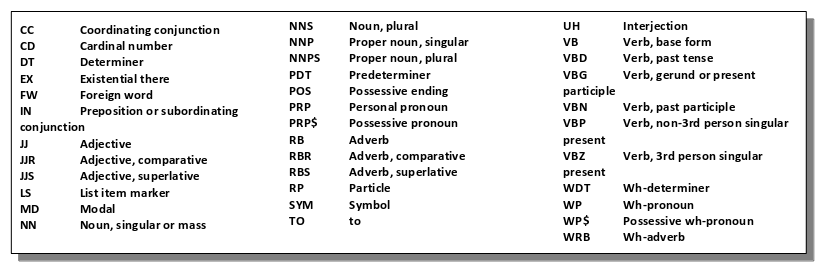

In [24]:
Image("nltk-speech-codes.png", width=900)

We select the noun

In [25]:
import nltk
from nltk.corpus import state_union
from nltk.tokenize import PunktSentenceTokenizer
 
document = 'Today the Netherlands celebrates King\'s Day. To honor this tradition, the Dutch embassy in San Francisco invited me to'
sentences = nltk.sent_tokenize(document)   
 
data = []
for sent in sentences:
    data = data + nltk.pos_tag(nltk.word_tokenize(sent))
 
    for word in data: 
        if ('NNP' or 'NNPS') in word[1]: 
            print(word[0]) # Print the first element

Netherlands
King
Day
San
Francisco


Apply these techniques iteratively to your dataset

#### Describe you dataset visually and statistically

In [ ]:
import seaborn as sns # Check examples to visualize it at https://seaborn.pydata.org/examples/index.html


#### Word cloud